# 1. Preparing

In [ ]:
# !python -m pip uninstall matplotlib
# !pip install matplotlib==3.1.3

In [ ]:
# !pip install matplotlib --upgrade

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
matplotlib.__version__

'3.5.3'

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('drive/MyDrive/datasets/devim.csv')
df.head(3)

,order_id,cred_sum_cc_all,mfo_inqs_count_month,all_closed_creds_sum_all,bank_inqs_count_quarter,cred_max_overdue_max_ly,all_active_creds_sum_all,mfo_last_days_all,cred_sum_cc_ly,cred_sum_debt_all_all,all_closed_creds_sum_ly,mfo_cred_mean_sum_3lm,delay_more_sum_all,all_creds_count_all,cred_day_overdue_all_sum_all,cred_max_overdue_max_3lm,mfo_closed_count_ly,cred_sum_overdue_cc_all,count_overdue_all_3lm,all_creds_count_lm,work_code,month_income,region,bad,approved
0,5498546,0.0,0,40364,0,0.0,3000,560,0.0,0.0,0,0.0,2,3,529,0.0,0,0.0,0,0,3,50000,46,NaN,0
1,5498604,1500.0,0,23456,0,0.0,0,9999,0.0,0.0,0,0.0,10,3,0,0.0,0,0.0,0,0,3,35000,17,NaN,0
2,5498609,0.1,0,17999,3,0.0,9999,9999,0.1,9999.0,0,0.0,18,4,0,0.0,0,0.0,0,2,3,35000,58,NaN,0


In [ ]:
df.shape

(23116, 25)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23116 entries, 0 to 23115
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   order_id                      23116 non-null  int64  
 1   cred_sum_cc_all               23116 non-null  float64
 2   mfo_inqs_count_month          23116 non-null  int64  
 3   all_closed_creds_sum_all      23116 non-null  int64  
 4   bank_inqs_count_quarter       23116 non-null  int64  
 5   cred_max_overdue_max_ly       23116 non-null  float64
 6   all_active_creds_sum_all      23116 non-null  int64  
 7   mfo_last_days_all             23116 non-null  int64  
 8   cred_sum_cc_ly                23116 non-null  float64
 9   cred_sum_debt_all_all         23116 non-null  float64
 10  all_closed_creds_sum_ly       23116 non-null  int64  
 11  mfo_cred_mean_sum_3lm         23116 non-null  float64
 12  delay_more_sum_all            23116 non-null  int64  
 13  a

In [ ]:
df.isnull().sum()

order_id                            0
cred_sum_cc_all                     0
mfo_inqs_count_month                0
all_closed_creds_sum_all            0
bank_inqs_count_quarter             0
cred_max_overdue_max_ly             0
all_active_creds_sum_all            0
mfo_last_days_all                   0
cred_sum_cc_ly                      0
cred_sum_debt_all_all               0
all_closed_creds_sum_ly             0
mfo_cred_mean_sum_3lm               0
delay_more_sum_all                  0
all_creds_count_all                 0
cred_day_overdue_all_sum_all        0
cred_max_overdue_max_3lm            0
mfo_closed_count_ly                 0
cred_sum_overdue_cc_all             0
count_overdue_all_3lm               0
all_creds_count_lm                  0
work_code                           0
month_income                        0
region                              0
bad                             15847
approved                            0
dtype: int64

In [ ]:
# from pandas.plotting import scatter_matrix
# scatter_matrix(df, figsize=(20, 16));

## make targets

In [ ]:
low_cardinality_cols = [x for x in df.columns if df[x].nunique() < 10]
low_cardinality_cols

['work_code', 'bad', 'approved']

In [ ]:
df_cat = df[['work_code', 'bad', 'approved']]
df_cat = df_cat.astype('object')

In [ ]:
# NaN ---> 2
df_cat['bad'] = df['bad'].fillna(2)
df_cat.bad.value_counts()
# 0 - returned
# 1 - not returned
# 2 - refusal 

2.0    15847
0.0     5306
1.0     1963
Name: bad, dtype: int64

In [ ]:
df_cat.approved.value_counts()
# 1 – y
# 0 – n

0    15847
1     7269
Name: approved, dtype: int64

In [ ]:
df_cat.describe(include='O')

,work_code,approved
count,23116,23116
unique,5,2
top,5,0
freq,7747,15847


## transform `bad` column

In [ ]:
onehot_bad = pd.get_dummies(df_cat['bad'])

df_bad_transformed = pd.concat([df_cat, onehot_bad] , axis=1)

In [ ]:
df_bad_transformed

,work_code,bad,approved,0.0,1.0,2.0
0,3,2.0,0,0,0,1
1,3,2.0,0,0,0,1
2,3,2.0,0,0,0,1
3,5,2.0,0,0,0,1
4,5,2.0,0,0,0,1
...,...,...,...,...,...,...
23111,3,2.0,0,0,0,1
23112,5,2.0,0,0,0,1
23113,4,2.0,0,0,0,1
23114,3,2.0,0,0,0,1


In [ ]:
df_bad_transformed.drop(columns=['work_code', 'approved', 'bad'], inplace=True, axis=1)

In [ ]:
df_bad_transformed

,0.0,1.0,2.0
0,0,0,1
1,0,0,1
2,0,0,1
3,0,0,1
4,0,0,1
...,...,...,...
23111,0,0,1
23112,0,0,1
23113,0,0,1
23114,0,0,1


In [ ]:
df_bad_transformed.rename({0.0: "returned",
                           1.0: "overdue",
                           2.0: "refusal"}, inplace=True, axis=1)

In [ ]:
df_bad_transformed

,returned,overdue,refusal
0,0,0,1
1,0,0,1
2,0,0,1
3,0,0,1
4,0,0,1
...,...,...,...
23111,0,0,1
23112,0,0,1
23113,0,0,1
23114,0,0,1


In [ ]:
# concat
df_prepared = pd.concat([df, df_bad_transformed] , axis=1)
df_prepared.drop(columns=['bad'], inplace=True)

In [ ]:
df_prepared.approved.value_counts()

0    15847
1     7269
Name: approved, dtype: int64

In [ ]:
df_prepared.refusal.value_counts()
# same

1    15847
0     7269
Name: refusal, dtype: int64

In [ ]:
df_prepared.columns

Index(['order_id', 'cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm', 'work_code',
       'month_income', 'region', 'approved', 'returned', 'overdue', 'refusal'],
      dtype='object')

In [ ]:
# сортируем, чтобы получить примерный порядок фич
df_prepared.sum().sort_values(ascending=False).index

Index(['order_id', 'all_closed_creds_sum_all', 'all_active_creds_sum_all',
       'cred_sum_debt_all_all', 'cred_sum_cc_all', 'month_income',
       'all_closed_creds_sum_ly', 'cred_sum_cc_ly', 'cred_sum_overdue_cc_all',
       'mfo_cred_mean_sum_3lm', 'cred_max_overdue_max_ly', 'mfo_last_days_all',
       'cred_max_overdue_max_3lm', 'cred_day_overdue_all_sum_all', 'region',
       'all_creds_count_all', 'delay_more_sum_all', 'bank_inqs_count_quarter',
       'mfo_closed_count_ly', 'work_code', 'mfo_inqs_count_month',
       'all_creds_count_lm', 'refusal', 'approved', 'returned',
       'count_overdue_all_3lm', 'overdue'],
      dtype='object')

In [ ]:
df_without = df_prepared[['order_id', 'all_closed_creds_sum_all', 'all_active_creds_sum_all',
       'cred_sum_debt_all_all', 'cred_sum_cc_all',
       'all_closed_creds_sum_ly', 'cred_sum_cc_ly', 'cred_sum_overdue_cc_all',
       'mfo_cred_mean_sum_3lm', 'cred_max_overdue_max_ly', 'mfo_last_days_all',
       'cred_max_overdue_max_3lm', 'cred_day_overdue_all_sum_all',
       'all_creds_count_all', 'delay_more_sum_all', 'bank_inqs_count_quarter',
       'mfo_closed_count_ly', 'mfo_inqs_count_month',
       'all_creds_count_lm','count_overdue_all_3lm',
       'region', 'work_code', 'month_income',
      #  'refusal', 'approved', 'returned', 'overdue'
       ]]

In [ ]:
convert_dict = {'work_code': 'category',
                'bad': 'category',
                'approved': 'category'
                }

In [ ]:
df_preapared = df.astype(convert_dict)

In [ ]:
df_preapared.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23116 entries, 0 to 23115
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   order_id                      23116 non-null  int64   
 1   cred_sum_cc_all               23116 non-null  float64 
 2   mfo_inqs_count_month          23116 non-null  int64   
 3   all_closed_creds_sum_all      23116 non-null  int64   
 4   bank_inqs_count_quarter       23116 non-null  int64   
 5   cred_max_overdue_max_ly       23116 non-null  float64 
 6   all_active_creds_sum_all      23116 non-null  int64   
 7   mfo_last_days_all             23116 non-null  int64   
 8   cred_sum_cc_ly                23116 non-null  float64 
 9   cred_sum_debt_all_all         23116 non-null  float64 
 10  all_closed_creds_sum_ly       23116 non-null  int64   
 11  mfo_cred_mean_sum_3lm         23116 non-null  float64 
 12  delay_more_sum_all            23116 non-null  

# 2. Pandas profiling

In [ ]:
# ! pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     - 22.0 MB 57 kB/s
  Using cached matplotlib-3.5.3-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.whl (11.2 MB)
     |████████████████████████████████| 102 kB 39.2 MB/s 
     |████████████████████████████████| 690 kB 41.6 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 9.9 MB 47.8 MB/s 
     |████████████████████████████████| 4.7 MB 26.0 MB/s 
     |████████████████████████████████| 296 kB 39.4 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.4.0-py2.py3-none-any.whl size=315269 sha256=8f4fec91a750b1c866ce996dd17ab6e49b0954b7e77e4279acc0e306449b7273
  Stored in directory: /tmp/pip-ephem-wheel-cache-abd8m0e7/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=d3c603ba013111161d2c4cc827ec1d7d7ec8cd7c0cdf64b

In [ ]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import pandas_profiling as pp

In [ ]:
import os
os._exit(00)

In [ ]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('drive/MyDrive/datasets/devim.csv')
df.head(3)

,order_id,cred_sum_cc_all,mfo_inqs_count_month,all_closed_creds_sum_all,bank_inqs_count_quarter,cred_max_overdue_max_ly,all_active_creds_sum_all,mfo_last_days_all,cred_sum_cc_ly,cred_sum_debt_all_all,...,cred_max_overdue_max_3lm,mfo_closed_count_ly,cred_sum_overdue_cc_all,count_overdue_all_3lm,all_creds_count_lm,work_code,month_income,region,bad,approved
0,5498546,0.0,0,40364,0,0.0,3000,560,0.0,0.0,...,0.0,0,0.0,0,0,3,50000,46,NaN,0
1,5498604,1500.0,0,23456,0,0.0,0,9999,0.0,0.0,...,0.0,0,0.0,0,0,3,35000,17,NaN,0
2,5498609,0.1,0,17999,3,0.0,9999,9999,0.1,9999.0,...,0.0,0,0.0,0,2,3,35000,58,NaN,0


In [ ]:
profile = ProfileReport(df, title="data set", html={'style' : {'full_width':True}})
profile.to_file(output_file="name of html file.html") 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# 3. EDA

## cat valiables

In [ ]:
matplotlib.__version__ # need to 3.5.3 for cat_eda

'3.5.3'

In [ ]:
#plot categorical Data (classification Task)
def cat_eda(data,feature,target):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    ax1 = sns.countplot(x=feature, data=data, ax=axes[0],color = "orange",edgecolor = "k")
    ax1.bar_label(ax1.containers[0])
    ax1.set_title(f"{feature} Distribution")
    
    ax2 = sns.countplot(x = feature,hue = target, data = data,ax = axes[1],palette = ["r",'lime'],edgecolor = "k")
    ax2.set_title(f"{feature} Distribution with target")
    ax2.bar_label(ax2.containers[0])
    ax2.bar_label(ax2.containers[1])

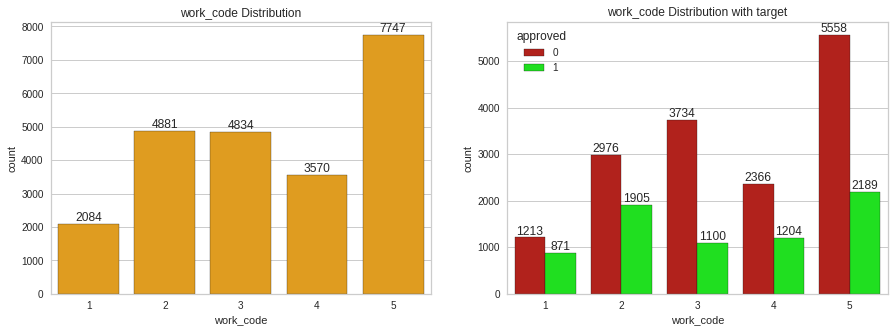

In [ ]:
cat_eda(df_prepared, "work_code", "approved")

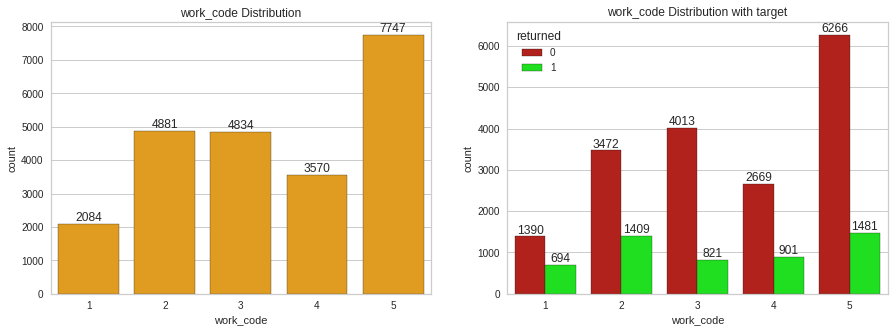

In [ ]:
cat_eda(df_prepared, "work_code", "returned")

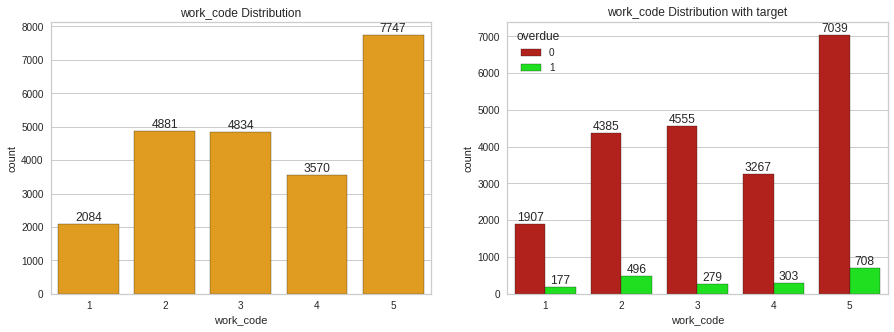

In [ ]:
cat_eda(df_prepared, "work_code", "overdue")

In [ ]:
# !python -m pip uninstall matplotlib
# !pip install matplotlib==3.1.3

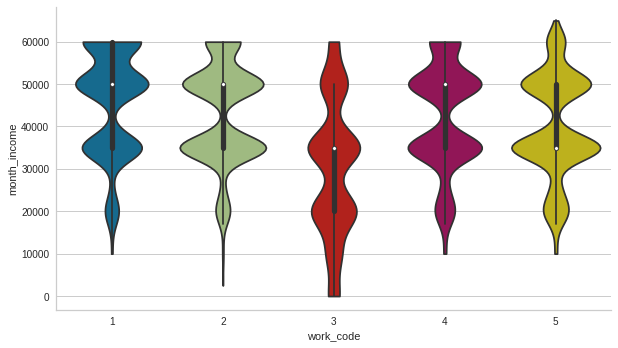

In [ ]:
# work_code and income
sns.catplot(
    data=df_prepared, x="work_code", y="month_income",
    kind="violin", bw=.25, cut=0, aspect=14/8);

## num variables

### hists

In [ ]:
df_prepared.columns

Index(['order_id', 'cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm', 'work_code',
       'month_income', 'region', 'approved', 'returned', 'overdue', 'refusal'],
      dtype='object')

In [ ]:
len(df_prepared.cred_max_overdue_max_ly.unique())

3734

In [ ]:
df_prepared.cred_max_overdue_max_ly.isin([0]).sum(axis=0)

15074

KeyError: ignored

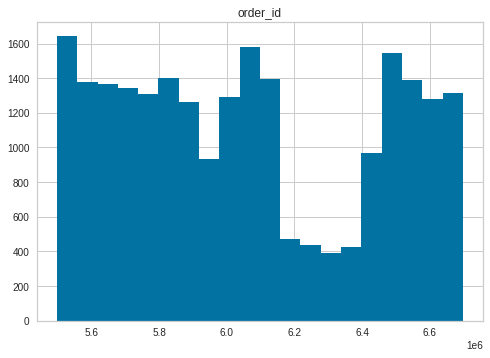

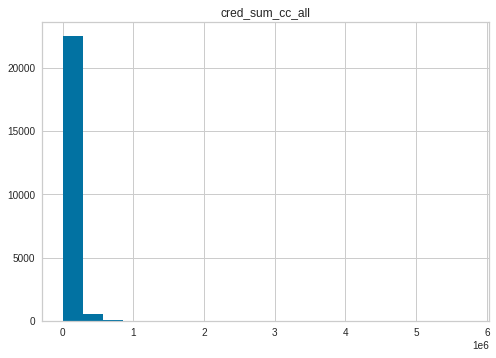

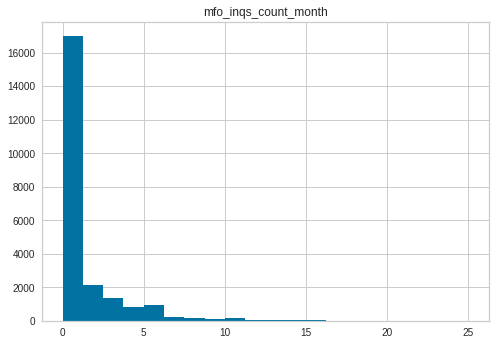

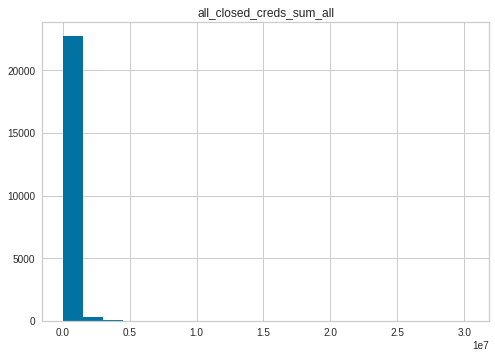

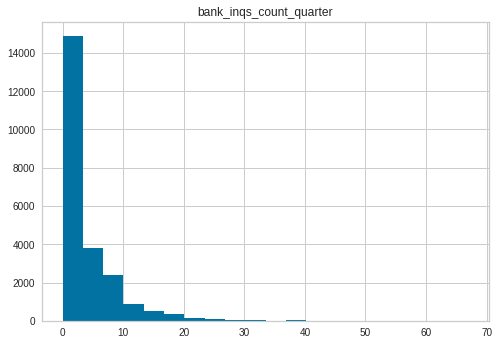

...

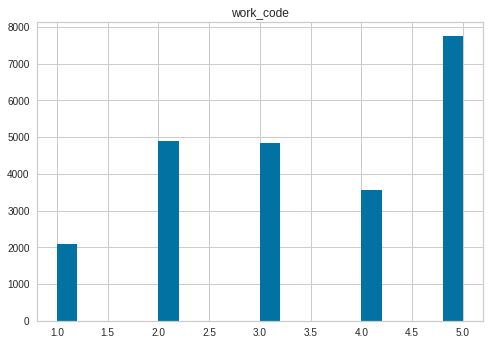

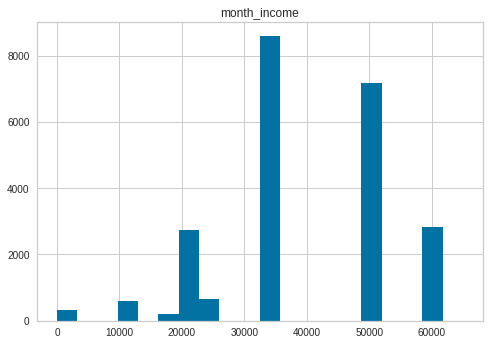

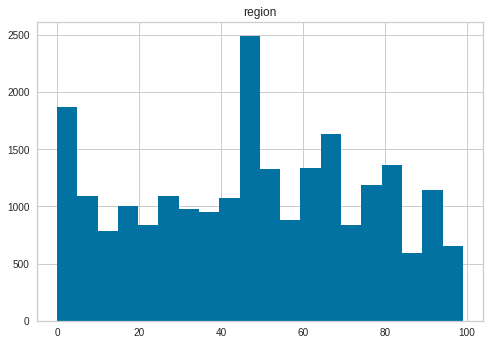

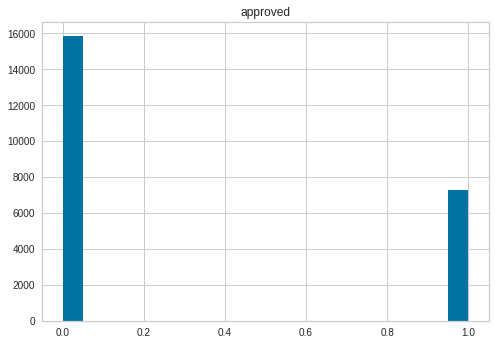

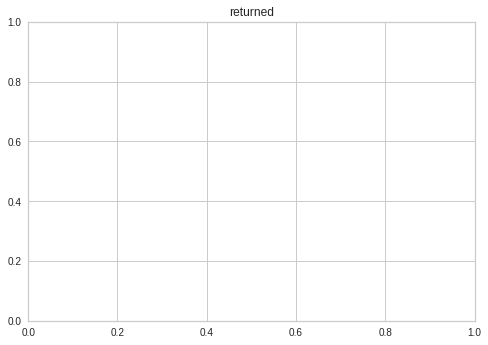

In [ ]:
for i in df_prepared.columns:
        plt.figure()
        plt.title(f'{i}')
        plt.hist(df_preapared[i], bins=20);

### corr

In [ ]:
categorical = ['work_code','approved', 'returned', 'overdue', 'refusal']
numerical = ['cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm',
       'month_income', 'region']
interesting = ['cred_sum_overdue_cc_all', 'month_income', 'cred_sum_cc_all', 'approved']

In [ ]:
df_prepared.describe().T

,count,mean,std,min,25%,50%,75%,max
order_id,23116.0,6.060602e+06,367848.038073,5498546.0,5739749.0,6020793.5,6.445488e+06,6697265.00
cred_sum_cc_all,23116.0,4.424794e+04,100601.596651,0.0,0.0,5000.0,4.972685e+04,5739786.09
mfo_inqs_count_month,23116.0,1.284262e+00,2.373415,0.0,0.0,0.0,2.000000e+00,25.00
all_closed_creds_sum_all,23116.0,1.653574e+05,478894.221794,0.0,3000.0,30834.5,1.357758e+05,30309967.00
bank_inqs_count_quarter,23116.0,3.760642e+00,5.057107,0.0,0.0,2.0,5.000000e+00,67.00
cred_max_overdue_max_ly,23116.0,4.070925e+03,26890.422460,0.0,0.0,0.0,3.000000e+03,1914581.16
all_active_creds_sum_all,23116.0,1.284212e+05,389071.817759,0.0,2000.0,15000.0,7.500000e+04,12000000.00
mfo_last_days_all,23116.0,2.615989e+03,4228.621029,0.0,13.0,83.5,2.070500e+03,9999.00
cred_sum_cc_ly,23116.0,1.067210e+04,37246.943546,0.0,0.0,0.0,0.000000e+00,878000.00
cred_sum_debt_all_all,23116.0,8.414683e+04,305472.366723,0.0,0.0,5000.0,3.496056e+04,11508246.66


In [ ]:
df_prepared.skew().sort_values(ascending=False)

cred_max_overdue_max_3lm        52.419893
cred_sum_overdue_cc_all         36.069266
cred_max_overdue_max_ly         35.146795
all_closed_creds_sum_all        16.921678
all_closed_creds_sum_ly         14.217408
cred_sum_cc_all                 12.013648
cred_sum_debt_all_all           10.040731
mfo_cred_mean_sum_3lm            9.782981
mfo_closed_count_ly              9.365255
all_active_creds_sum_all         8.295224
all_creds_count_all              8.201599
count_overdue_all_3lm            7.293266
cred_sum_cc_ly                   6.277718
cred_day_overdue_all_sum_all     5.436262
all_creds_count_lm               4.686976
delay_more_sum_all               4.410490
mfo_inqs_count_month             3.360647
overdue                          2.978222
bank_inqs_count_quarter          2.671452
returned                         1.286357
mfo_last_days_all                1.159635
approved                         0.799288
order_id                         0.218276
region                          -0

In [ ]:
corr_matrix = df_prepared.corr()

In [ ]:
# 1st target (одобрено)
corr_matrix["approved"].sort_values(ascending=False)

approved                        1.000000
returned                        0.805912
overdue                         0.449791
all_creds_count_lm              0.432273
bank_inqs_count_quarter         0.383284
mfo_closed_count_ly             0.323730
mfo_cred_mean_sum_3lm           0.315625
all_creds_count_all             0.280020
all_closed_creds_sum_ly         0.279090
cred_sum_cc_ly                  0.255395
mfo_inqs_count_month            0.240049
cred_sum_debt_all_all           0.226264
cred_sum_cc_all                 0.193103
month_income                    0.191862
all_active_creds_sum_all        0.176089
all_closed_creds_sum_all        0.150458
order_id                        0.057191
cred_max_overdue_max_3lm        0.036980
region                          0.001223
cred_max_overdue_max_ly        -0.021931
count_overdue_all_3lm          -0.051477
cred_sum_overdue_cc_all        -0.074283
work_code                      -0.082536
delay_more_sum_all             -0.173997
mfo_last_days_al

Наибольшая корреляция `approved` с:
 * количество кредитов, взятых за последний месяц
 * кол-во запросов на кредиты в банки
 * кол-во закрытых МФО кредитов, взятых за
последний год

In [ ]:
# 2nd target (возвращен)
corr_matrix["returned"].sort_values(ascending=False)

returned                        1.000000
approved                        0.805912
all_creds_count_lm              0.345324
bank_inqs_count_quarter         0.303929
mfo_closed_count_ly             0.286720
mfo_cred_mean_sum_3lm           0.258462
all_closed_creds_sum_ly         0.248852
all_creds_count_all             0.247337
cred_sum_cc_ly                  0.198917
cred_sum_debt_all_all           0.193375
month_income                    0.165162
cred_sum_cc_all                 0.164856
mfo_inqs_count_month            0.160617
all_active_creds_sum_all        0.154259
all_closed_creds_sum_all        0.139501
order_id                        0.064456
cred_max_overdue_max_3lm        0.028068
region                          0.009311
cred_max_overdue_max_ly        -0.015856
count_overdue_all_3lm          -0.057768
cred_sum_overdue_cc_all        -0.059465
work_code                      -0.092516
delay_more_sum_all             -0.140097
mfo_last_days_all              -0.163812
overdue         

Наибольшая корреляция с:
 * количество кредитов, взятых за последний месяц
 * кол-во запросов на кредиты в банки
 * кол-во закрытых МФО кредитов, взятых за
последний год

– тоже самое

In [ ]:
# 3rd target (просрочен)
corr_matrix["overdue"].sort_values(ascending=False)

overdue                         1.000000
approved                        0.449791
all_creds_count_lm              0.199034
bank_inqs_count_quarter         0.179886
mfo_inqs_count_month            0.157516
mfo_cred_mean_sum_3lm           0.135786
cred_sum_cc_ly                  0.125298
mfo_closed_count_ly             0.106656
all_creds_count_all             0.093265
all_closed_creds_sum_ly         0.089431
cred_sum_debt_all_all           0.085138
cred_sum_cc_all                 0.072929
month_income                    0.070401
all_active_creds_sum_all        0.060577
all_closed_creds_sum_all        0.040151
cred_max_overdue_max_3lm        0.019250
work_code                       0.002098
count_overdue_all_3lm           0.001408
order_id                       -0.001982
region                         -0.012009
cred_max_overdue_max_ly        -0.012609
cred_sum_overdue_cc_all        -0.034017
delay_more_sum_all             -0.078458
cred_day_overdue_all_sum_all   -0.096429
mfo_last_days_al

In [ ]:
# 4th target (отказано)
corr_matrix["refusal"].sort_values(ascending=False)

refusal                         1.000000
cred_day_overdue_all_sum_all    0.211764
mfo_last_days_all               0.207467
delay_more_sum_all              0.173997
work_code                       0.082536
cred_sum_overdue_cc_all         0.074283
count_overdue_all_3lm           0.051477
cred_max_overdue_max_ly         0.021931
region                         -0.001223
cred_max_overdue_max_3lm       -0.036980
order_id                       -0.057191
all_closed_creds_sum_all       -0.150458
all_active_creds_sum_all       -0.176089
month_income                   -0.191862
cred_sum_cc_all                -0.193103
cred_sum_debt_all_all          -0.226264
mfo_inqs_count_month           -0.240049
cred_sum_cc_ly                 -0.255395
all_closed_creds_sum_ly        -0.279090
all_creds_count_all            -0.280020
mfo_cred_mean_sum_3lm          -0.315625
mfo_closed_count_ly            -0.323730
bank_inqs_count_quarter        -0.383284
all_creds_count_lm             -0.432273
overdue         

Наибольшая корреляция `refusal` с:
 * Суммарное количество дней просрочки текущих активных кредитов
 * Количество дней с последнего займа в МФО
 * Количество просрочек более чем на 90 дней по всем кредитам

– Корреляция идентичная approved, только с другим знаком

### scatter + heatmap

In [ ]:
from pandas.plotting import scatter_matrix

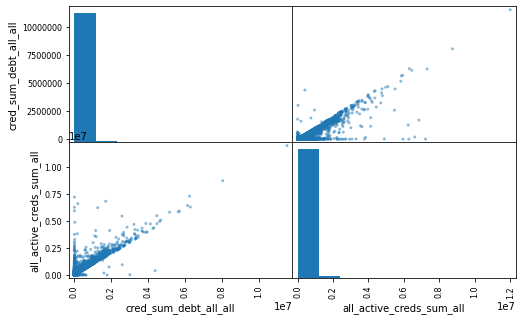

In [ ]:
scatter_matrix(df_prepared[['cred_sum_debt_all_all', 'all_active_creds_sum_all']], figsize=(8, 5));
# Сумма задолженности по всем кредитам, денежная сумма всех активных кредитов

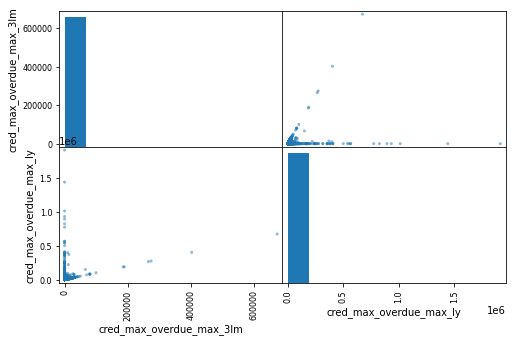

In [ ]:
scatter_matrix(df_prepared[['cred_max_overdue_max_3lm', 'cred_max_overdue_max_ly']], figsize=(8, 5));

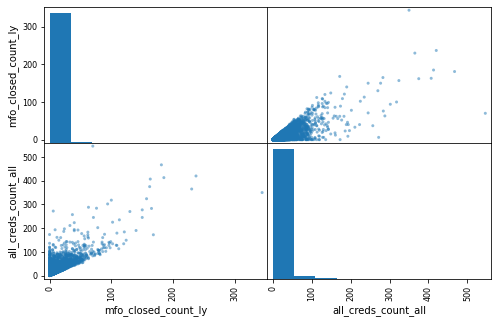

In [ ]:
scatter_matrix(df_prepared[['mfo_closed_count_ly', 'all_creds_count_all']], figsize=(8, 5));

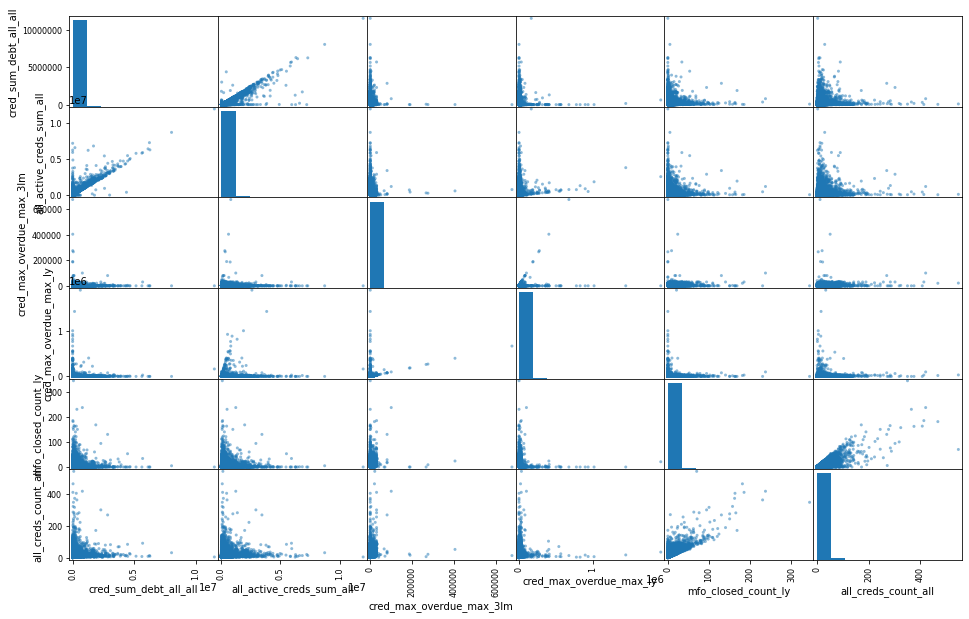

In [ ]:
scatter_matrix(df_prepared[['cred_sum_debt_all_all',
                       'all_active_creds_sum_all',
                       'cred_max_overdue_max_3lm',
                       'cred_max_overdue_max_ly',
                       'mfo_closed_count_ly',
                       'all_creds_count_all']], figsize=(16, 10));

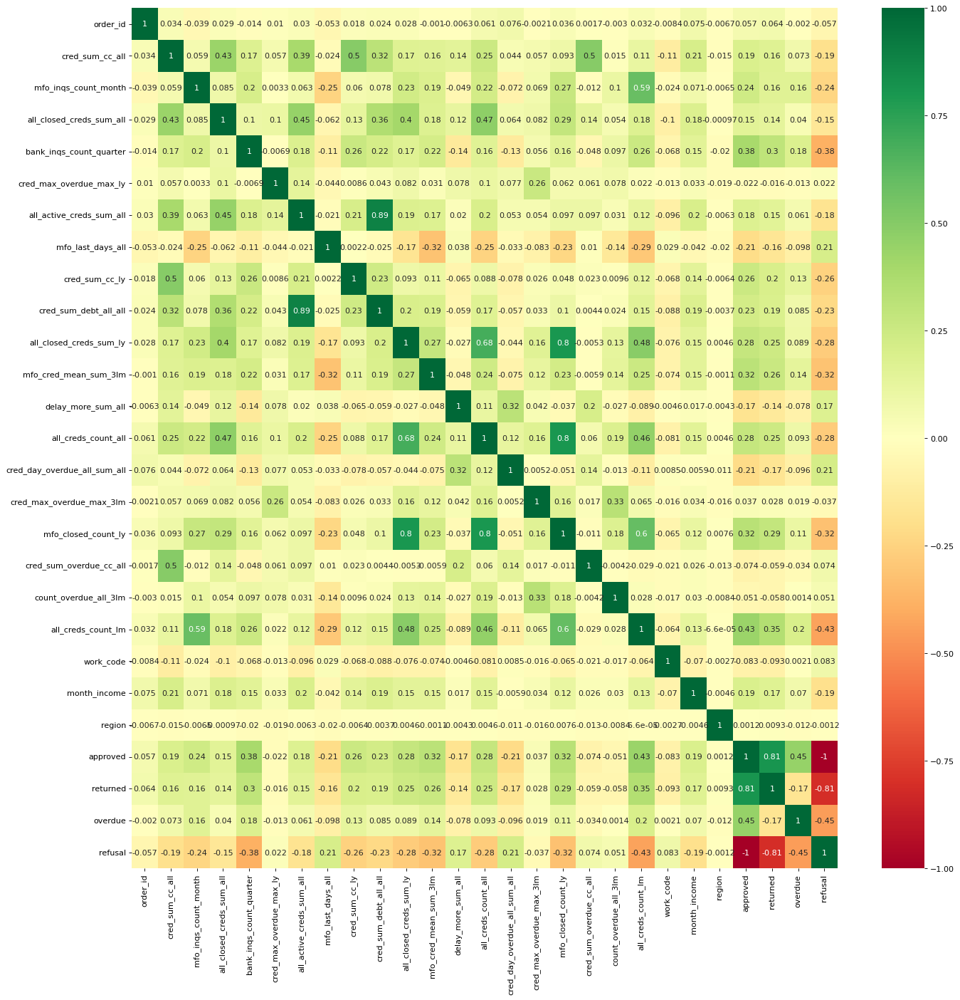

In [ ]:
# heatmap

plt.figure(figsize=(20, 20), dpi= 80)
sns.heatmap(df_prepared.corr(), xticklabels=df_prepared.corr().columns,
            yticklabels=df_prepared.corr().columns,
            cmap='RdYlGn',
            center=0,
            annot=True,
            fmt='.2g');

### box/hist

In [ ]:
#fungsi untuk plotting
def num_eda(data,feature,target,bins ):
    df_set_pos = data[data[target] == True].drop(target,axis = 1)
    df_set_neg = data[data[target] == False].drop(target,axis = 1)
    #plot numerical data (Classification Task)
    fig, axes = plt.subplots(2,2,figsize = (18,4))

    ax1 = sns.histplot(x = feature,data = data,ax = axes[0,0],bins = bins,kde = True,edgecolor = "k",color = "orange")
    ax1.grid(linestyle='--', linewidth=0.5, color='gray')
    ax1.set_title(f"{feature} Distribution")
    
    ax2 = sns.histplot(x = feature,data = df_set_pos,ax = axes[0,1],bins = bins,label = "approved",kde = True,color = "green",linewidth = 0 )
    ax2_1 = sns.histplot(x = feature,data = df_set_neg,ax = axes[0,1],label = "Not - approved",bins = bins,kde = True,color = "red",linewidth = 0)
    ax2.grid(linestyle='--', linewidth=0.1, color='gray')
    ax2.set_title(f"{feature} Distribution by Target Class")
    ax2.legend()
    
    ax3 = sns.boxplot(x = feature,data = data,ax = axes[1,0],color = "orange")
    ax3.grid(linestyle='--', linewidth=0.5, color='gray')
    
    ax4 = sns.boxplot(x = feature,y = target,data = data,ax = axes[1,1],orient = "h",palette = ["red","green"])
    ax4.grid(linestyle='--', linewidth=0.1, color='gray')
    ax4.legend()

In [ ]:
df_prepared.columns

Index(['order_id', 'cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm', 'work_code',
       'month_income', 'region', 'approved', 'returned', 'overdue', 'refusal'],
      dtype='object')

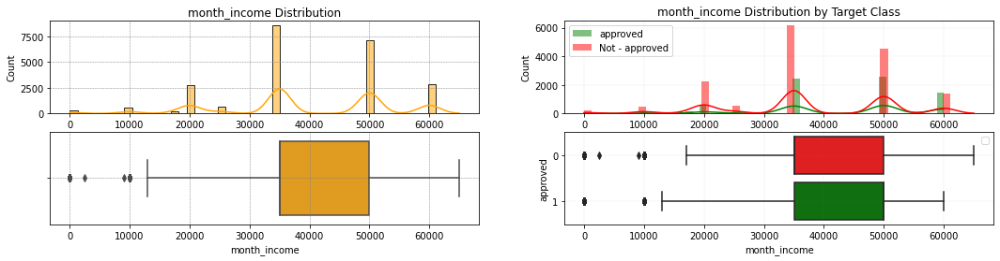

In [ ]:
num_eda(df_prepared, "month_income", "approved", 50)

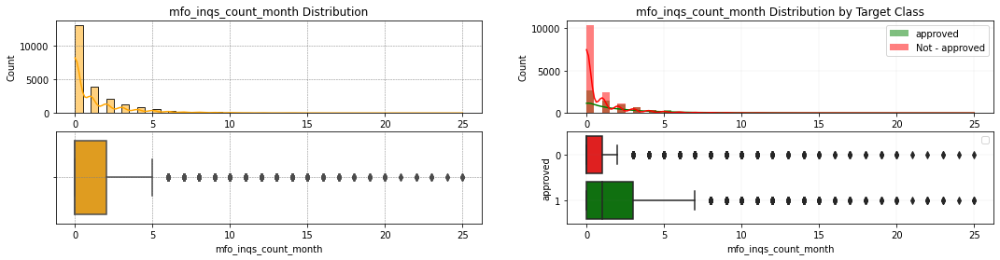

In [ ]:
num_eda(df_prepared, "mfo_inqs_count_month", "approved", 50)

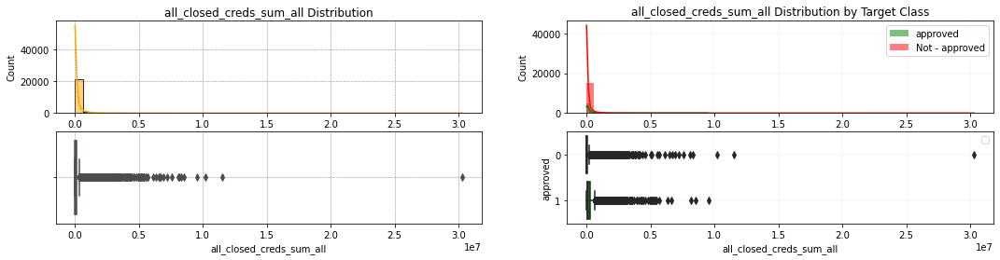

In [ ]:
num_eda(df_prepared, "all_closed_creds_sum_all", "approved", 50)

### violin/box

In [ ]:
import plotly.express as px
import plotly.figure_factory as ff

In [ ]:
# px.violin(exp, y="delay_more_sum_all")

px.violin(df_prepared, y='cred_sum_cc_all', box=True,
                    points='all')

In [ ]:
# px.violin(exp, y="delay_more_sum_all")

px.violin(df_prepared, y='mfo_inqs_count_month', box=True,
                    points='all')

In [ ]:
# px.violin(exp, y="delay_more_sum_all")

px.violin(df_prepared, y='cred_day_overdue_all_sum_all', box=True,
                    points='all')

In [ ]:
# px.violin(exp, y="delay_more_sum_all")

px.violin(df_prepared, y='cred_max_overdue_max_3lm', box=True,
                    points='all')

In [ ]:
# px.violin(exp, y="delay_more_sum_all")

px.violin(df_prepared, y='cred_sum_overdue_cc_all', box=True,
                    points='all')

In [ ]:
# cat_cols = ['approved', 'returned', 'overdue', 'refusal', 'work_code']

# df_num = df_prepared.copy()
# df_num = df_prepared.drop(cat_cols, axis=1)

## num variables (df_log)

In [ ]:
df_log10 = np.log(df_prepared + 0.000000001)
df_log10.columns

Index(['order_id', 'cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm', 'work_code',
       'month_income', 'region', 'approved', 'returned', 'overdue', 'refusal'],
      dtype='object')

### hists и corr

In [ ]:
df_log10.head()

,order_id,cred_sum_cc_all,mfo_inqs_count_month,all_closed_creds_sum_all,bank_inqs_count_quarter,cred_max_overdue_max_ly,all_active_creds_sum_all,mfo_last_days_all,cred_sum_cc_ly,cred_sum_debt_all_all,...,cred_sum_overdue_cc_all,count_overdue_all_3lm,all_creds_count_lm,work_code,month_income,region,approved,returned,overdue,refusal
0,15.519994,-20.723266,-20.723266,10.605694,-2.072327e+01,-20.723266,8.006368,6.327937,-20.723266,-20.723266,...,-20.723266,-20.723266,-20.723266,1.098612,10.819778,3.828641,-20.723266,-20.723266,-20.723266,1.000000e-09
1,15.520005,7.313220,-20.723266,10.062882,-2.072327e+01,-20.723266,-20.723266,9.210240,-20.723266,-20.723266,...,-20.723266,-20.723266,-20.723266,1.098612,10.463103,2.833213,-20.723266,-20.723266,-20.723266,1.000000e-09
2,15.520006,-2.302585,-20.723266,9.798071,1.098612e+00,-20.723266,9.210240,9.210240,-2.302585,9.210240,...,-20.723266,-20.723266,0.693147,1.098612,10.463103,4.060443,-20.723266,-20.723266,-20.723266,1.000000e-09
3,15.520012,8.517193,-20.723266,12.654747,-2.072327e+01,-20.723266,-20.723266,9.210240,-20.723266,-20.723266,...,8.501870,-20.723266,-20.723266,1.609438,10.463103,1.386294,-20.723266,-20.723266,-20.723266,1.000000e-09
4,15.520013,-20.723266,-20.723266,-20.723266,1.000000e-09,-20.723266,-20.723266,9.210240,-20.723266,-20.723266,...,-20.723266,-20.723266,-20.723266,1.609438,10.463103,3.526361,-20.723266,-20.723266,-20.723266,1.000000e-09


In [ ]:
df_log10.columns

Index(['order_id', 'cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm', 'work_code',
       'month_income', 'region', 'approved', 'returned', 'overdue', 'refusal'],
      dtype='object')

In [ ]:
categorical = ['work_code','approved', 'returned', 'overdue', 'refusal']
numerical = ['cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm',
       'month_income', 'region']
interesting = ['cred_sum_overdue_cc_all', 'month_income', 'cred_sum_cc_all', 'approved']

In [ ]:
df_log10.describe().T

,count,mean,std,min,25%,50%,75%,max
order_id,23116.0,15.615488,0.060439,1.551999e+01,15.562926,1.561073e+01,1.567889e+01,1.571721e+01
cred_sum_cc_all,23116.0,-3.141761,15.239415,-2.072327e+01,-20.723266,8.517193e+00,1.081430e+01,1.556293e+01
mfo_inqs_count_month,23116.0,-11.398119,10.664129,-2.072327e+01,-20.723266,-2.072327e+01,6.931472e-01,3.218876e+00
all_closed_creds_sum_all,23116.0,4.133837,13.087799,-2.072327e+01,8.006368,1.033639e+01,1.181876e+01,1.722699e+01
bank_inqs_count_quarter,23116.0,-5.005369,9.950575,-2.072327e+01,-20.723266,6.931472e-01,1.609438e+00,4.204693e+00
cred_max_overdue_max_ly,23116.0,-10.557171,13.939805,-2.072327e+01,-20.723266,-2.072327e+01,8.006368e+00,1.446501e+01
all_active_creds_sum_all,23116.0,3.803858,12.820952,-2.072327e+01,7.600902,9.615805e+00,1.122524e+01,1.630042e+01
mfo_last_days_all,23116.0,5.042882,2.932261,-2.072327e+01,2.564949,4.424829e+00,7.635545e+00,9.210240e+00
cred_sum_cc_ly,23116.0,-14.286538,12.170506,-2.072327e+01,-20.723266,-2.072327e+01,-2.072327e+01,1.368540e+01
cred_sum_debt_all_all,23116.0,-2.062913,15.194820,-2.072327e+01,-20.723266,8.517193e+00,1.046198e+01,1.625857e+01


In [ ]:
df_log10.skew().sort_values(ascending=False)

overdue                         2.978222
count_overdue_all_3lm           2.897881
cred_sum_overdue_cc_all         2.322503
cred_max_overdue_max_3lm        2.122463
cred_sum_cc_ly                  1.433491
returned                        1.286357
approved                        0.799288
cred_day_overdue_all_sum_all    0.656081
cred_max_overdue_max_ly         0.648091
all_creds_count_lm              0.336706
mfo_inqs_count_month            0.273557
delay_more_sum_all              0.257884
mfo_closed_count_ly             0.216079
order_id                        0.156150
all_closed_creds_sum_ly         0.124573
mfo_last_days_all               0.052948
mfo_cred_mean_sum_3lm          -0.023681
cred_sum_cc_all                -0.245764
cred_sum_debt_all_all          -0.395812
refusal                        -0.799288
work_code                      -0.901546
bank_inqs_count_quarter        -0.933685
all_closed_creds_sum_all       -1.339911
all_active_creds_sum_all       -1.351802
region          

In [ ]:
corr_matrix = df_log10.corr()

In [ ]:
# 1st target (одобрено)
corr_matrix["approved"].sort_values(ascending=False)

approved                        1.000000
returned                        0.805912
cred_sum_debt_all_all           0.466722
overdue                         0.449791
all_creds_count_lm              0.432000
all_closed_creds_sum_ly         0.431205
mfo_closed_count_ly             0.425438
mfo_cred_mean_sum_3lm           0.411925
all_creds_count_all             0.364065
cred_sum_cc_ly                  0.320747
bank_inqs_count_quarter         0.296315
all_closed_creds_sum_all        0.284630
mfo_inqs_count_month            0.266749
all_active_creds_sum_all        0.260317
cred_sum_cc_all                 0.216740
order_id                        0.059653
cred_max_overdue_max_3lm        0.052257
cred_max_overdue_max_ly         0.042666
month_income                    0.039232
region                          0.011650
count_overdue_all_3lm          -0.060067
work_code                      -0.092621
cred_sum_overdue_cc_all        -0.139280
delay_more_sum_all             -0.282165
cred_day_overdue

Наибольшая корреляция `approved` с:
 * количество кредитов, взятых за последний месяц
 * кол-во запросов на кредиты в банки
 * кол-во закрытых МФО кредитов, взятых за
последний год

In [ ]:
# 2nd target (возвращен)
corr_matrix["returned"].sort_values(ascending=False)

returned                        1.000000
approved                        0.805912
cred_sum_debt_all_all           0.372710
all_closed_creds_sum_ly         0.360585
mfo_closed_count_ly             0.355414
all_creds_count_lm              0.338601
mfo_cred_mean_sum_3lm           0.326956
all_creds_count_all             0.301277
cred_sum_cc_ly                  0.249026
bank_inqs_count_quarter         0.239466
all_closed_creds_sum_all        0.234277
all_active_creds_sum_all        0.205932
mfo_inqs_count_month            0.196960
cred_sum_cc_all                 0.173978
order_id                        0.066438
month_income                    0.029535
cred_max_overdue_max_3lm        0.020623
cred_max_overdue_max_ly         0.020277
region                          0.018219
count_overdue_all_3lm          -0.069878
work_code                      -0.100690
cred_sum_overdue_cc_all        -0.112816
overdue                        -0.166275
delay_more_sum_all             -0.224867
cred_day_overdue

Наибольшая корреляция с:
 * количество кредитов, взятых за последний месяц
 * кол-во запросов на кредиты в банки
 * кол-во закрытых МФО кредитов, взятых за
последний год

– тоже самое

In [ ]:
# 3rd target (просрочен)
corr_matrix["overdue"].sort_values(ascending=False)

overdue                         1.000000
approved                        0.449791
cred_sum_debt_all_all           0.215097
all_creds_count_lm              0.208721
mfo_cred_mean_sum_3lm           0.192854
all_closed_creds_sum_ly         0.174232
mfo_closed_count_ly             0.172428
cred_sum_cc_ly                  0.158552
all_creds_count_all             0.151875
mfo_inqs_count_month            0.147161
bank_inqs_count_quarter         0.132280
all_active_creds_sum_all        0.122913
all_closed_creds_sum_all        0.120647
cred_sum_cc_all                 0.098537
cred_max_overdue_max_3lm        0.055925
cred_max_overdue_max_ly         0.040473
month_income                    0.020788
count_overdue_all_3lm           0.005370
order_id                       -0.000871
work_code                      -0.002368
region                         -0.008081
cred_sum_overdue_cc_all        -0.061790
delay_more_sum_all             -0.130738
cred_day_overdue_all_sum_all   -0.137279
returned        

In [ ]:
# 4th target (отказано)
corr_matrix["refusal"].sort_values(ascending=False)

refusal                         1.000000
mfo_last_days_all               0.370680
cred_day_overdue_all_sum_all    0.331595
delay_more_sum_all              0.282165
cred_sum_overdue_cc_all         0.139280
work_code                       0.092621
count_overdue_all_3lm           0.060067
region                         -0.011650
month_income                   -0.039232
cred_max_overdue_max_ly        -0.042666
cred_max_overdue_max_3lm       -0.052257
order_id                       -0.059653
cred_sum_cc_all                -0.216740
all_active_creds_sum_all       -0.260317
mfo_inqs_count_month           -0.266749
all_closed_creds_sum_all       -0.284630
bank_inqs_count_quarter        -0.296315
cred_sum_cc_ly                 -0.320747
all_creds_count_all            -0.364065
mfo_cred_mean_sum_3lm          -0.411925
mfo_closed_count_ly            -0.425438
all_closed_creds_sum_ly        -0.431205
all_creds_count_lm             -0.432000
overdue                        -0.449791
cred_sum_debt_al

Наибольшая корреляция `refusal` с:
 * Суммарное количество дней просрочки текущих активных кредитов
 * Количество дней с последнего займа в МФО
 * Количество просрочек более чем на 90 дней по всем кредитам

– Корреляция идентичная approved, только с другим знаком

### scatter + heatmap

In [ ]:
from pandas.plotting import scatter_matrix

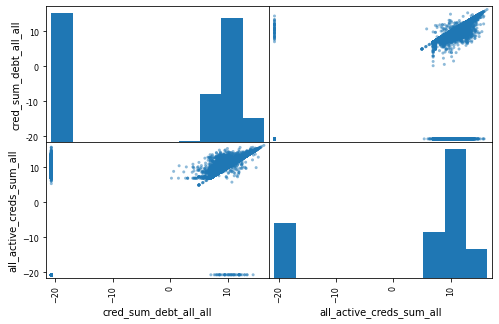

In [ ]:
scatter_matrix(df_log10[['cred_sum_debt_all_all', 'all_active_creds_sum_all']], figsize=(8, 5));
# Сумма задолженности по всем кредитам, денежная сумма всех активных кредитов

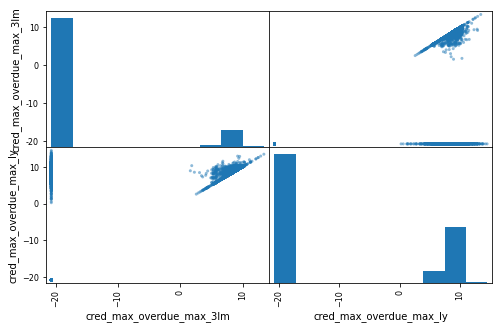

In [ ]:
scatter_matrix(df_log10[['cred_max_overdue_max_3lm', 'cred_max_overdue_max_ly']], figsize=(8, 5));

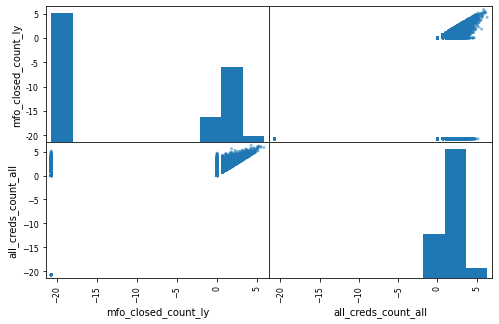

In [ ]:
scatter_matrix(df_log10[['mfo_closed_count_ly', 'all_creds_count_all']], figsize=(8, 5));

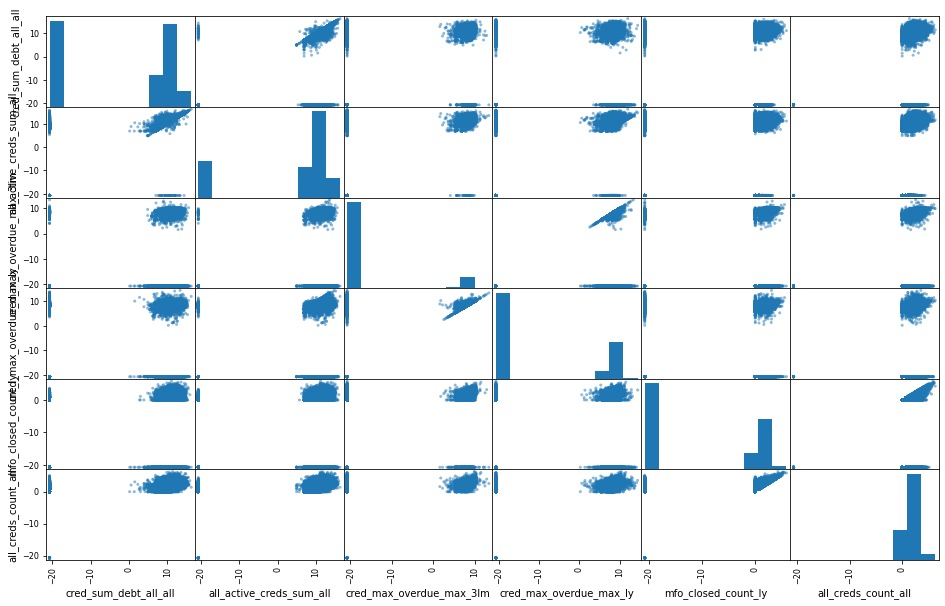

In [ ]:
scatter_matrix(df_log10[['cred_sum_debt_all_all',
                       'all_active_creds_sum_all',
                       'cred_max_overdue_max_3lm',
                       'cred_max_overdue_max_ly',
                       'mfo_closed_count_ly',
                       'all_creds_count_all']], figsize=(16, 10));

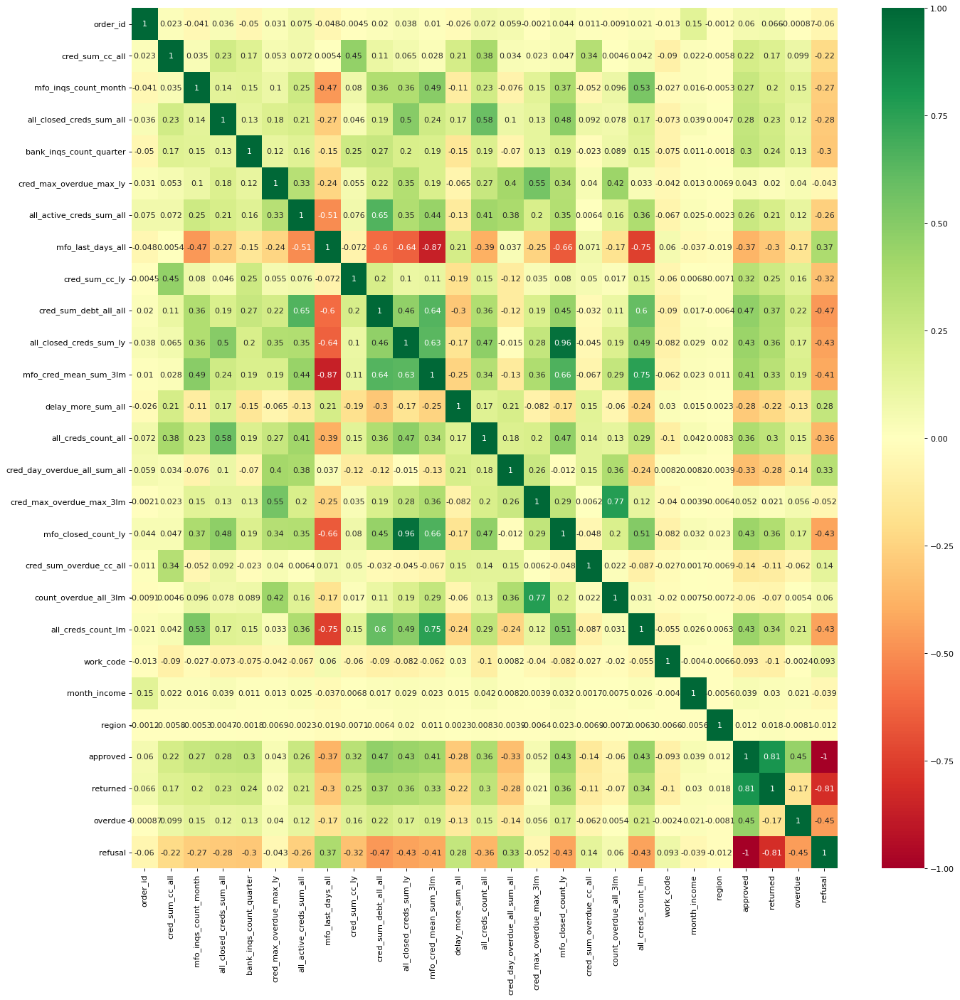

In [ ]:
# heatmap

plt.figure(figsize=(20, 20), dpi= 80)
sns.heatmap(df_log10.corr(), xticklabels=df_log10.corr().columns,
            yticklabels=df_log10.corr().columns,
            cmap='RdYlGn',
            center=0,
            annot=True,
            fmt='.2g');

### box/hist

In [ ]:
#fungsi untuk plotting
def num_eda(data,feature,target,bins ):
    df_set_pos = data[data[target] == True].drop(target,axis = 1)
    df_set_neg = data[data[target] == False].drop(target,axis = 1)
    #plot numerical data (Classification Task)
    fig, axes = plt.subplots(2,2,figsize = (18,4))

    ax1 = sns.histplot(x = feature,data = data,ax = axes[0,0],bins = bins,kde = True,edgecolor = "k",color = "orange")
    ax1.grid(linestyle='--', linewidth=0.5, color='gray')
    ax1.set_title(f"{feature} Distribution")
    
    ax2 = sns.histplot(x = feature,data = df_set_pos,ax = axes[0,1],bins = bins,label = "approved",kde = True,color = "green",linewidth = 0 )
    ax2_1 = sns.histplot(x = feature,data = df_set_neg,ax = axes[0,1],label = "Not - approved",bins = bins,kde = True,color = "red",linewidth = 0)
    ax2.grid(linestyle='--', linewidth=0.1, color='gray')
    ax2.set_title(f"{feature} Distribution by Target Class")
    ax2.legend()
    
    ax3 = sns.boxplot(x = feature,data = data,ax = axes[1,0],color = "orange")
    ax3.grid(linestyle='--', linewidth=0.5, color='gray')
    
    ax4 = sns.boxplot(x = feature,y = target,data = data,ax = axes[1,1],orient = "h",palette = ["red","green"])
    ax4.grid(linestyle='--', linewidth=0.1, color='gray')
    ax4.legend()

In [ ]:
df_log10.columns

Index(['order_id', 'cred_sum_cc_all', 'mfo_inqs_count_month',
       'all_closed_creds_sum_all', 'bank_inqs_count_quarter',
       'cred_max_overdue_max_ly', 'all_active_creds_sum_all',
       'mfo_last_days_all', 'cred_sum_cc_ly', 'cred_sum_debt_all_all',
       'all_closed_creds_sum_ly', 'mfo_cred_mean_sum_3lm',
       'delay_more_sum_all', 'all_creds_count_all',
       'cred_day_overdue_all_sum_all', 'cred_max_overdue_max_3lm',
       'mfo_closed_count_ly', 'cred_sum_overdue_cc_all',
       'count_overdue_all_3lm', 'all_creds_count_lm', 'work_code',
       'month_income', 'region', 'approved', 'returned', 'overdue', 'refusal'],
      dtype='object')

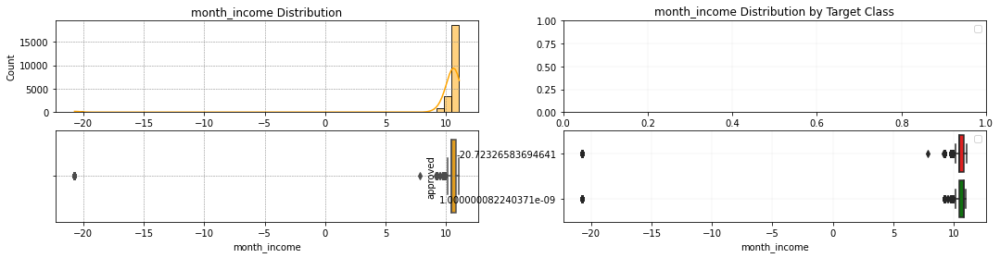

In [ ]:
num_eda(df_log10, "month_income", "approved", 50)

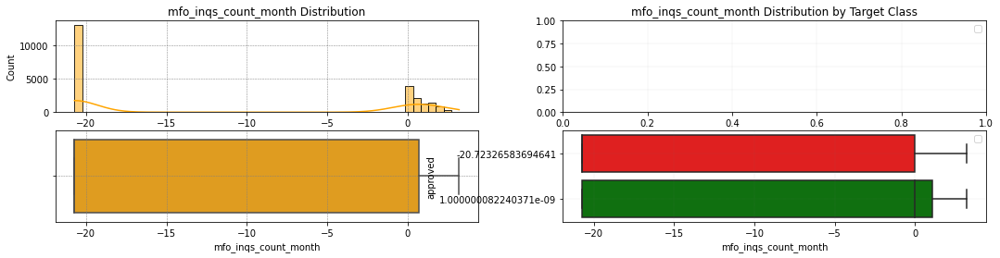

In [ ]:
num_eda(df_log10, "mfo_inqs_count_month", "approved", 50)

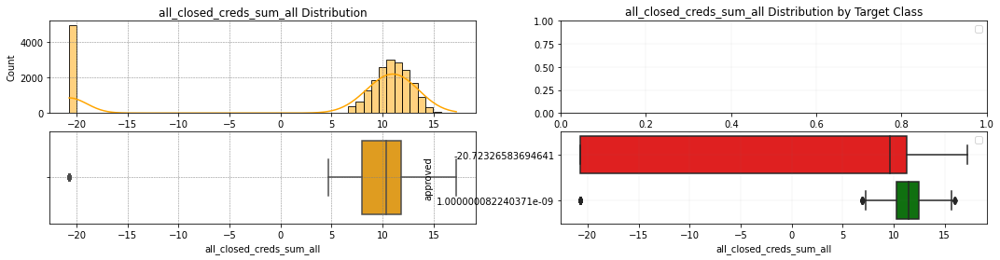

In [ ]:
num_eda(df_log10, "all_closed_creds_sum_all", "approved", 50)

### violin/box

In [ ]:
import plotly.express as px
import plotly.figure_factory as ff

In [ ]:
# px.violin(exp, y="delay_more_sum_all")

px.violin(df_log10, y='cred_sum_cc_all', box=True,
                    points='all')

In [ ]:
# px.violin(exp, y="delay_more_sum_all")

px.violin(df_log10, y='mfo_inqs_count_month', box=True,
                    points='all')

In [ ]:
# px.violin(exp, y="delay_more_sum_all")

px.violin(df_log10, y='cred_day_overdue_all_sum_all', box=True,
                    points='all')

In [ ]:
# px.violin(exp, y="delay_more_sum_all")

px.violin(df_log10, y='cred_max_overdue_max_3lm', box=True,
                    points='all')

In [ ]:
# px.violin(exp, y="delay_more_sum_all")

px.violin(df_log10, y='cred_sum_overdue_cc_all', box=True,
                    points='all')

In [ ]:
# cat_cols = ['approved', 'returned', 'overdue', 'refusal', 'work_code']

# df_num = df_prepared.copy()
# df_num = df_prepared.drop(cat_cols, axis=1)

# 4. Anomaly Detection

## visualization

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

### cred_sum_cc_all

In [ ]:
df3.cred_sum_cc_all.describe()

count    2.311600e+04
mean     4.424794e+04
std      1.006016e+05
min      0.000000e+00
25%      0.000000e+00
50%      5.000000e+03
75%      4.972685e+04
max      5.739786e+06
Name: cred_sum_cc_all, dtype: float64

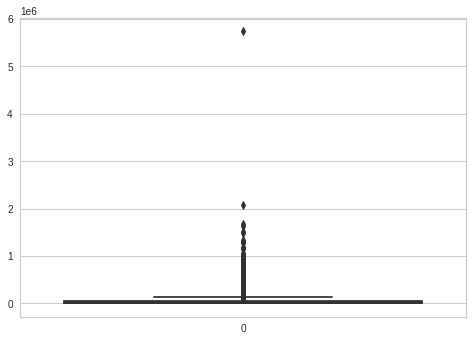

In [ ]:
sns.boxplot(data=df3.cred_sum_cc_all);

<AxesSubplot:>

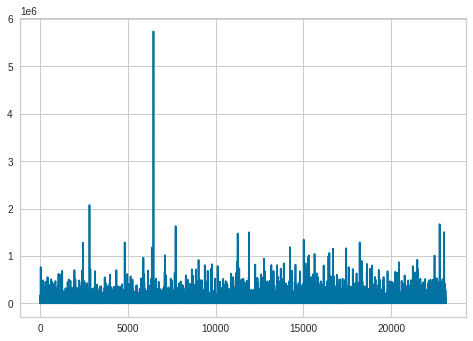

In [ ]:
df3.cred_sum_cc_all.plot()

выброс

### all_closed_creds_sum_all

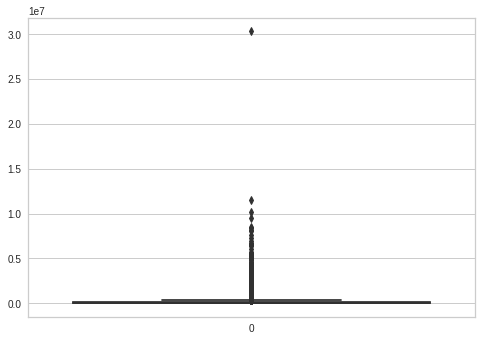

In [ ]:
sns.boxplot(data=df3.all_closed_creds_sum_all);

<AxesSubplot:>

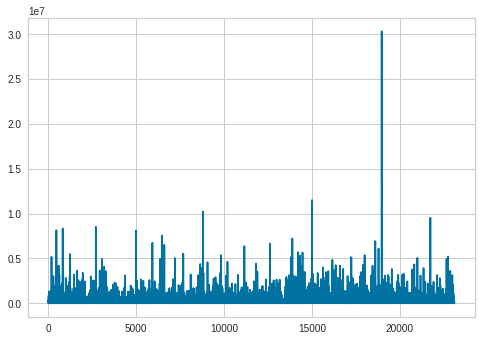

In [ ]:
df3.all_closed_creds_sum_all.plot()

выброс

## Isolate Forest (using PyCaret)

In [ ]:
# ! pip install pycaret

In [ ]:
from pycaret.anomaly import *
s = setup(df_without,
          categorical_features = ['work_code'],
          numeric_features = ['count_overdue_all_3lm', 'month_income'],
          normalize=True)

,Description,Value
0,session_id,5110
1,Original Data,"(23116, 23)"
2,Missing Values,False
3,Numeric Features,22
4,Categorical Features,1
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(23116, 27)"
9,CPU Jobs,-1


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=['work_code'],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=['count_overdue_all_3lm',
                                                          'month_income'],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                fill...
                ('P_transform', 'passthrough'), ('binn', 'passthrough'),
                ('rem_outliers', 'passthrough'), ('cluster_all', 'passthrough'),
                ('dummy', 

In [ ]:
# ! pip install --upgrade numpy==1.20

In [ ]:
iforest = create_model('iforest')

INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=5110, verbose=0)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
models()

INFO:logs:gpu_param set to False


,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [ ]:
plot_model(iforest, plot = 'umap')

INFO:logs:Rendering Visual


In [ ]:
result = assign_model(iforest)
result.head()

INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=5110, verbose=0), transformation=False, score=True, verbose=True)
INFO:logs:Checking exceptions
INFO:logs:Determining Trained Model
INFO:logs:Trained Model : Isolation Forest
INFO:logs:Copying data
INFO:logs:(23116, 25)
INFO:logs:assign_model() succesfully completed......................................


,order_id,all_closed_creds_sum_all,all_active_creds_sum_all,cred_sum_debt_all_all,cred_sum_cc_all,all_closed_creds_sum_ly,cred_sum_cc_ly,cred_sum_overdue_cc_all,mfo_cred_mean_sum_3lm,cred_max_overdue_max_ly,...,bank_inqs_count_quarter,mfo_closed_count_ly,mfo_inqs_count_month,all_creds_count_lm,count_overdue_all_3lm,region,work_code,month_income,Anomaly,Anomaly_Score
0,5498546,40364,3000,0.0,0.0,0,0.0,0.00,0.0,0.0,...,0,0,0,0,0,46,3,50000,0,-0.133904
1,5498604,23456,0,0.0,1500.0,0,0.0,0.00,0.0,0.0,...,0,0,0,0,0,17,3,35000,0,-0.118778
2,5498609,17999,9999,9999.0,0.1,0,0.1,0.00,0.0,0.0,...,3,0,0,2,0,58,3,35000,0,-0.104944
3,5498645,313247,0,0.0,5000.0,0,0.0,4923.97,0.0,0.0,...,0,0,0,0,0,4,5,35000,0,-0.104854
4,5498647,0,0,0.0,0.0,0,0.0,0.00,0.0,0.0,...,1,0,0,0,0,34,5,35000,0,-0.126301


In [ ]:
predictions = predict_model(iforest, data = df_prepared)
predictions.head()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=5110, verbose=0), ml_usecase=MLUsecase.ANOMALY)


,order_id,cred_sum_cc_all,mfo_inqs_count_month,all_closed_creds_sum_all,bank_inqs_count_quarter,cred_max_overdue_max_ly,all_active_creds_sum_all,mfo_last_days_all,cred_sum_cc_ly,cred_sum_debt_all_all,...,all_creds_count_lm,work_code,month_income,region,approved,returned,overdue,refusal,Anomaly,Anomaly_Score
0,5498546,0.0,0,40364,0,0.0,3000,560,0.0,0.0,...,0,3,50000,46,0,0,0,1,0,-0.133904
1,5498604,1500.0,0,23456,0,0.0,0,9999,0.0,0.0,...,0,3,35000,17,0,0,0,1,0,-0.118778
2,5498609,0.1,0,17999,3,0.0,9999,9999,0.1,9999.0,...,2,3,35000,58,0,0,0,1,0,-0.104944
3,5498645,5000.0,0,313247,0,0.0,0,9999,0.0,0.0,...,0,5,35000,4,0,0,0,1,0,-0.104854
4,5498647,0.0,0,0,1,0.0,0,9999,0.0,0.0,...,0,5,35000,34,0,0,0,1,0,-0.126301


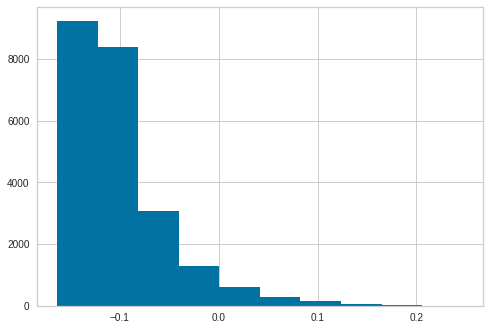

In [ ]:
predictions.Anomaly_Score.hist();

In [ ]:
predictions.Anomaly.value_counts()

0    21960
1     1156
Name: Anomaly, dtype: int64

# 5. Models

## Clustering

### K-means (scikit)

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans

In [ ]:
# df_without.drop(['order_id'], inplace=True, axis=1)

In [ ]:
criteries = []
for k in range(2,10):
  KModel=KMeans(n_clusters=k, random_state=3)
  KModel.fit(df_without)
  criteries.append(KModel.inertia_)

print(criteries)

[7098632223141924.0, 5666696188192756.0, 4530381786333271.0, 3847473264000447.0, 3299860295092832.5, 2853263457004453.0, 2506352911643469.0, 2255196505085788.0]


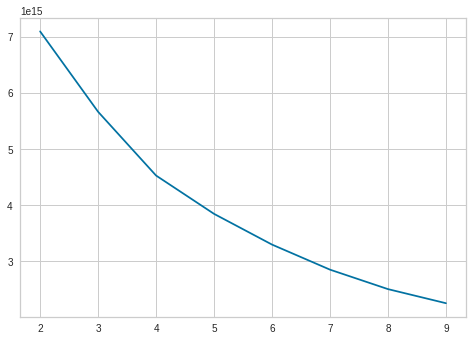

In [ ]:
plt.plot(range(2,10), criteries);

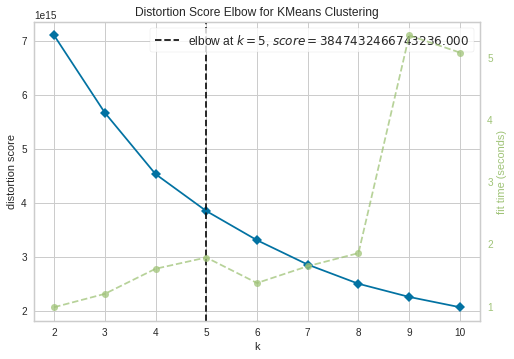

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from yellowbrick.cluster import KElbowVisualizer

Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(df_without)
Elbow_M.show()

In [ ]:
KModel = KMeans(n_clusters=5)
KModel.fit(df_without)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs='deprecated',
       precompute_distances='deprecated', random_state=None, tol=0.0001,
       verbose=0)

In [ ]:
labels = KModel.labels_

In [ ]:
len(labels)

23116

In [ ]:
df_cluster = df_prepared.copy()
df_cluster['Cluster'] = labels

In [ ]:
df_cluster.loc[:, ['Cluster']]

,Cluster
0,0
1,0
2,0
3,0
4,0
...,...
23111,0
23112,0
23113,0
23114,0


In [ ]:
df_cluster.Cluster.value_counts()

0    20595
4     2102
1      280
2      138
3        1
Name: Cluster, dtype: int64

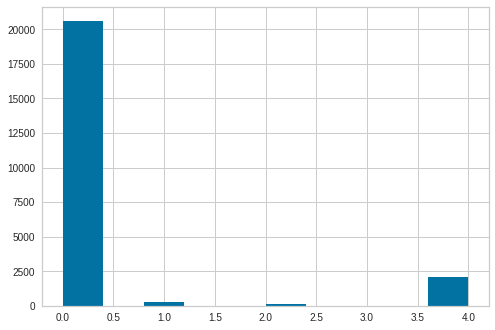

In [ ]:
df_cluster.Cluster.hist();

### K-means (PyCaret)

In [ ]:
from pycaret.clustering import *

In [ ]:
s2 = setup(data = df_without,
          categorical_features = ['work_code', 'month_income'],
          numeric_features = ['count_overdue_all_3lm'],
          normalize_method = 'robust',
          normalize=True)

,Description,Value
0,session_id,2339
1,Original Data,"(23116, 23)"
2,Missing Values,False
3,Numeric Features,21
4,Categorical Features,2
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(23116, 44)"
9,CPU Jobs,-1


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=['work_code',
                                                            'month_income'],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=['count_overdue_all_3lm'],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                fill...
                ('P_transform', 'passthrough'), ('binn', 'passthrough'),
                ('rem_outliers', 'passthrough'), ('cluster_all', 'passthrough'),
                ('dummy'

In [ ]:
kmeans = create_model('kmeans', num_clusters=6)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.8577,21385.9185,0.533,0,0,0


INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=6, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=2339, tol=0.0001, verbose=0)
INFO:logs:create_model() succesfully completed......................................


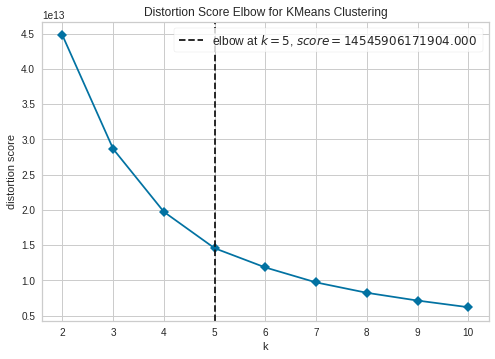

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot='elbow')

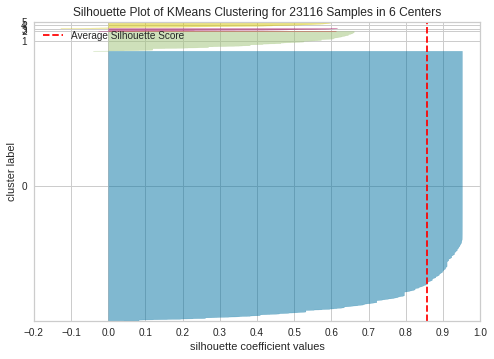

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot='silhouette')

In [ ]:
plot_model(kmeans, plot='cluster')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot='distribution')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot='distribution', feature='month_income')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot='distribution', feature='work_code')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
km_df = assign_model(kmeans)

INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=6, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=2339, tol=0.0001, verbose=0), transformation=False, score=True, verbose=True)
INFO:logs:Checking exceptions
INFO:logs:Determining Trained Model
INFO:logs:Trained Model : K-Means Clustering
INFO:logs:Copying data
INFO:logs:(23116, 24)
INFO:logs:assign_model() succesfully completed......................................


In [ ]:
km_df.head()

,order_id,all_closed_creds_sum_all,all_active_creds_sum_all,cred_sum_debt_all_all,cred_sum_cc_all,all_closed_creds_sum_ly,cred_sum_cc_ly,cred_sum_overdue_cc_all,mfo_cred_mean_sum_3lm,cred_max_overdue_max_ly,...,delay_more_sum_all,bank_inqs_count_quarter,mfo_closed_count_ly,mfo_inqs_count_month,all_creds_count_lm,count_overdue_all_3lm,region,work_code,month_income,Cluster
0,5498546,40364,3000,0.0,0.0,0,0.0,0.00,0.0,0.0,...,2,0,0,0,0,0,46,3,50000,Cluster 0
1,5498604,23456,0,0.0,1500.0,0,0.0,0.00,0.0,0.0,...,10,0,0,0,0,0,17,3,35000,Cluster 0
2,5498609,17999,9999,9999.0,0.1,0,0.1,0.00,0.0,0.0,...,18,3,0,0,2,0,58,3,35000,Cluster 0
3,5498645,313247,0,0.0,5000.0,0,0.0,4923.97,0.0,0.0,...,8,0,0,0,0,0,4,5,35000,Cluster 0
4,5498647,0,0,0.0,0.0,0,0.0,0.00,0.0,0.0,...,11,1,0,0,0,0,34,5,35000,Cluster 0


In [ ]:
km_df.Cluster.value_counts()

Cluster 0    20929
Cluster 1     1525
Cluster 4      430
Cluster 3      211
Cluster 5       18
Cluster 2        3
Name: Cluster, dtype: int64

In [ ]:
evaluate_model(kmeans)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=6, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=2339, tol=0.0001, verbose=0), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Cluster PCA Plot (2d)', …

## AdaBoost(PyCaret)

In [ ]:
from pycaret.classification import *

In [ ]:
df_ada = df_prepared.drop(['refusal', 'overdue', 'returned'], axis=1)
df_ada.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23116 entries, 0 to 23115
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   order_id                      23116 non-null  int64  
 1   cred_sum_cc_all               23116 non-null  float64
 2   mfo_inqs_count_month          23116 non-null  int64  
 3   all_closed_creds_sum_all      23116 non-null  int64  
 4   bank_inqs_count_quarter       23116 non-null  int64  
 5   cred_max_overdue_max_ly       23116 non-null  float64
 6   all_active_creds_sum_all      23116 non-null  int64  
 7   mfo_last_days_all             23116 non-null  int64  
 8   cred_sum_cc_ly                23116 non-null  float64
 9   cred_sum_debt_all_all         23116 non-null  float64
 10  all_closed_creds_sum_ly       23116 non-null  int64  
 11  mfo_cred_mean_sum_3lm         23116 non-null  float64
 12  delay_more_sum_all            23116 non-null  int64  
 13  a

In [ ]:
s3 = setup(data = df_ada,
            categorical_features = ['work_code', 'month_income'],
            numeric_features = ['count_overdue_all_3lm'],
            feature_interaction = True,
            normalize_method = 'robust',
            target = 'approved', feature_selection=True, normalize=True, session_id = 123)

,Description,Value
0,session_id,123
1,Target,approved
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(23116, 24)"
5,Missing Values,False
6,Numeric Features,21
7,Categorical Features,2
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=['work_code',
                                                            'month_income'],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=['count_overdue_all_3lm'],
                                      target='approved', time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categ...
                 Advanced_Feature_Selection_Classic(ml_usecase='classification',
                                                    n_jobs=-1, random_state=123,
                 

In [ ]:
adaboost = create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8925,0.9476,0.8196,0.8360,0.8277,0.7496,0.7497
1,0.8956,0.9616,0.8271,0.8386,0.8328,0.7569,0.7569
2,0.8993,0.9568,0.8291,0.8474,0.8381,0.7650,0.7651
3,0.8844,0.9475,0.8075,0.8220,0.8147,0.7307,0.7308
4,0.8980,0.9539,0.8114,0.8568,0.8335,0.7601,0.7607
5,0.8900,0.9513,0.8134,0.8330,0.8231,0.7433,0.7434
6,0.9054,0.9598,0.8310,0.8633,0.8468,0.7785,0.7788
7,0.8844,0.9492,0.7819,0.8397,0.8098,0.7269,0.7279
8,0.9011,0.9541,0.8314,0.8514,0.8413,0.7695,0.7696


INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=123)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
evaluate_model(adaboost)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=123), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…